In [1]:
# Import necessary libraries
import os
os.chdir('/lustre/scratch/aylar/integer')
import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns  
import matplotlib.pyplot as plt
import harmonypy as hm
import warnings
warnings.filterwarnings('ignore')

In [2]:

# Read input datasets
adata1 = sc.read("leiden_GSE207422.h5ad")
adata2 = sc.read("leiden_NTB_GSE131907.h5ad")

# Assign batch labels for both datasets
adata1.obs["batch"] = "batch1"
adata2.obs["batch"] = "batch2"

In [3]:
adata1.obs.head()

,Sample,Patient,Sex,Age,Pathology,PD1 Antibody,Chemotherapy,Pathologic Response,Residual Tumor,RECIST,n_genes,total_counts,percent_mito,percent_ribo,leiden,batch
BD_immune01_612637,BD_immune01,P01,Male,68,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,7202,45924.0,0.066675,0.110596,5,batch1
BD_immune01_698718,BD_immune01,P01,Male,68,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,7356,41596.0,0.042504,0.133498,5,batch1
BD_immune01_509246,BD_immune01,P01,Male,68,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,6346,31883.0,0.170153,0.062228,5,batch1
BD_immune01_101435,BD_immune01,P01,Male,68,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,6632,31458.0,0.069871,0.087927,5,batch1
BD_immune01_400370,BD_immune01,P01,Male,68,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,3237,9912.0,0.108253,0.128935,0,batch1


In [4]:
adata2.obs.head()

,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype,n_genes,total_counts,percent_mito,percent_ribo,leiden,batch
AAACCTGAGAAGGTGA_LUNG_N18,AAACCTGAGAAGGTGA,LUNG_N18,nLung,T lymphocytes,T/NK cells,CD4+ Th,1113,2918.492676,0.017582,0.134281,0,batch2
AAACCTGAGACAAAGG_LUNG_N18,AAACCTGAGACAAAGG,LUNG_N18,nLung,Myeloid cells,Myeloid cells,Monocytes,1100,2954.887695,0.016685,0.129273,4,batch2
AAACCTGAGACCTTTG_LUNG_N30,AAACCTGAGACCTTTG,LUNG_N30,nLung,T lymphocytes,NaN,NaN,847,2415.281250,0.022868,0.175550,0,batch2
AAACCTGAGACGACGT_LUNG_T09,AAACCTGAGACGACGT,LUNG_T09,tLung,Myeloid cells,Myeloid cells,CD1c+ DCs,2348,3620.102539,0.014272,0.113133,4,batch2
AAACCTGAGACGACGT_LUNG_T34,AAACCTGAGACGACGT,LUNG_T34,tLung,B lymphocytes,B lymphocytes,Follicular B cells,1313,2941.928223,0.018880,0.146811,7,batch2


In [5]:
# Concatenate datasets, keeping track of batches
adata = adata1.concatenate(adata2, batch_key="batch", index_unique="-")

In [6]:
adata.obs.head()

,Sample,Patient,Sex,Age,Pathology,PD1 Antibody,Chemotherapy,Pathologic Response,Residual Tumor,RECIST,...,total_counts,percent_mito,percent_ribo,leiden,batch,Barcode,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
BD_immune01_612637-0,BD_immune01,P01,Male,68.0,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,...,45924.0,0.066675,0.110596,5,0,NaN,NaN,NaN,NaN,NaN
BD_immune01_698718-0,BD_immune01,P01,Male,68.0,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,...,41596.0,0.042504,0.133498,5,0,NaN,NaN,NaN,NaN,NaN
BD_immune01_509246-0,BD_immune01,P01,Male,68.0,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,...,31883.0,0.170153,0.062228,5,0,NaN,NaN,NaN,NaN,NaN
BD_immune01_101435-0,BD_immune01,P01,Male,68.0,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,...,31458.0,0.069871,0.087927,5,0,NaN,NaN,NaN,NaN,NaN
BD_immune01_400370-0,BD_immune01,P01,Male,68.0,Squamous,Toripalimab,Carboplatin+Docetaxel,NE,NE,SD,...,9912.0,0.108253,0.128935,0,0,NaN,NaN,NaN,NaN,NaN


In [22]:
# Normalize total counts to 10,000 per cell
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Identify highly variable genes
sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor='seurat')

marker_genes = ["EPCAM", "COL1A1", "VWF", "CD3E", "CD79A", "MS4A1", "IGHG1",
               "CSF3R", "LYZ", "FGFBP2", "KIT", "LILRA4", "MKI67","PTPRC",
                "C1orf194","RSPH1", "C9orf24", "CAPS", "TPPP3", "SLPI",
                "SCGB1A1","SCGB3A1", "MSMB", "BPIFB1", "GJB6", "MYH11", 
                "AL365357.1", "SERPINB9", "IL1R2","SPARCL1", "NAPSA", "SCGB3A2",
                "SFTPB", "SFTPA1","SFTPA2", "SMC4", "ARL6IP1","CENPF","TPX2", 
                "TOP2A", "DUT","RRM2","HIST1H2BJ","TYMS", "PCNA","IGKC","MT2A",
                "S100A9","KRT81","S100P","PI3","KLK10","LY6G6C","CEACAM5","KRT16",
                "NDUFA4L2","AKR1B10","NMRAL2P","ALDH3A1", "DST",'EPCAM', 'KRT19',
                'CDH1', 'KRT18', 'CD3D', 'CD3E', 'CD3G', 'TRAC', 'CD79A', 'IGHM', 
                'IGHG3', 'IGHA2', 'CD68', 'MARCO', 'FCGR3A', 'LYZ', 'NCAM1', 'NKG7',
                'GNLY', 'KLRD1', 'KIT', 'MS4A2', 'GATA2', 'DCN', 'COL1A1', 'COL1A2', 
                'THY1', 'PECAM1', 'CLDN5', 'FLT1', 'RAMP2', 'OLIG1', 'OLIG2', 'MOG', 'CLDN11']
# Identify missing marker genes
missing_markers = [gene for gene in marker_genes if gene not in adata.var_names]
if missing_markers:
    print(f"Warning: The following marker genes are not in the dataset and will be ignored:\n{missing_markers}")

# Ensure marker genes are retained in HVGs
adata.var["highly_variable"] = adata.var["highly_variable"] | adata.var_names.isin(marker_genes)

# Subset the AnnData object to keep only highly variable genes (including forced markers)
adata = adata[:, adata.var["highly_variable"]]

# Verify which marker genes were successfully retained
retained_markers = [gene for gene in marker_genes if gene in adata.var_names]
print(f"Retained marker genes: {len(retained_markers)} / {len(marker_genes)}")
print(retained_markers)

['CD3E', 'CSF3R', 'LILRA4', 'MKI67', 'PTPRC', 'AL365357.1', 'NMRAL2P', 'CDH1', 'CD3D', 'CD3E', 'CD3G', 'TRAC', 'CD68', 'MARCO', 'FCGR3A', 'NCAM1', 'NKG7', 'THY1', 'PECAM1', 'FLT1', 'OLIG1', 'OLIG2', 'MOG', 'CLDN11']
Retained marker genes: 71 / 95
['EPCAM', 'COL1A1', 'VWF', 'CD79A', 'MS4A1', 'IGHG1', 'LYZ', 'FGFBP2', 'KIT', 'C1orf194', 'RSPH1', 'C9orf24', 'CAPS', 'TPPP3', 'SLPI', 'SCGB1A1', 'SCGB3A1', 'MSMB', 'BPIFB1', 'GJB6', 'MYH11', 'SERPINB9', 'IL1R2', 'SPARCL1', 'NAPSA', 'SCGB3A2', 'SFTPB', 'SFTPA1', 'SFTPA2', 'SMC4', 'ARL6IP1', 'CENPF', 'TPX2', 'TOP2A', 'DUT', 'RRM2', 'HIST1H2BJ', 'TYMS', 'PCNA', 'IGKC', 'MT2A', 'S100A9', 'KRT81', 'S100P', 'PI3', 'KLK10', 'LY6G6C', 'CEACAM5', 'KRT16', 'NDUFA4L2', 'AKR1B10', 'ALDH3A1', 'DST', 'EPCAM', 'KRT19', 'KRT18', 'CD79A', 'IGHM', 'IGHG3', 'IGHA2', 'LYZ', 'GNLY', 'KLRD1', 'KIT', 'MS4A2', 'GATA2', 'DCN', 'COL1A1', 'COL1A2', 'CLDN5', 'RAMP2']


In [27]:
# PCA & neighbors
sc.tl.pca(adata)
sc.pp.neighbors(adata, use_rep="X_pca")
sc.tl.umap(adata)

In [28]:
sc.tl.leiden(adata, resolution=0.2)
# Count total Leiden clusters
num_clusters = len(adata.obs['leiden'].unique())
print(f"Number of Leiden clusters: {num_clusters}")

Number of Leiden clusters: 10


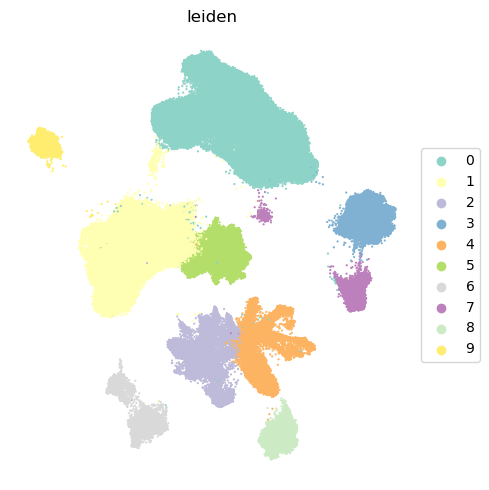

In [29]:
fig, ax = plt.subplots(figsize=(5, 5))  # Set figure size
sc.pl.umap(adata, color="leiden", size=10, frameon=False, ax=ax, show=False, palette='Set3')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("leiden_INT.png", dpi=300)
plt.show()

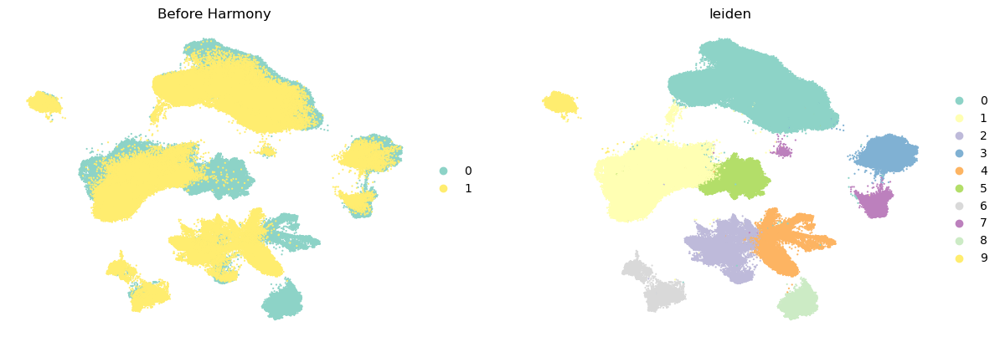

In [30]:
# Plot UMAP before Harmony, colored by batch and cluster
sc.pl.umap(adata, color=["batch", "leiden"], title="Before Harmony", size=10, frameon=False,  show=False, palette='Set3')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("INT_before_harmony.png", dpi=300)
plt.show() 

In [31]:
# Perform batch correction using Harmony
harmony_results = hm.run_harmony(
    data_mat=adata.obsm["X_pca"],   # PCA embeddings
    meta_data=adata.obs,            # Metadata (obs dataframe)
    vars_use=["batch"]               # Correct for batch variable
)

# Fix the shape of the Harmony-corrected embeddings
adata.obsm["X_pca_harmony"] = harmony_results.Z_corr.T  

# Compute neighbors and clustering using the Harmony-corrected PCA embeddings
sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.umap(adata)

2025-03-26 17:10:06,856 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-03-26 17:10:53,235 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-03-26 17:10:55,799 - harmonypy - INFO - Iteration 1 of 10
2025-03-26 17:13:53,821 - harmonypy - INFO - Iteration 2 of 10
2025-03-26 17:16:51,468 - harmonypy - INFO - Iteration 3 of 10
2025-03-26 17:19:53,377 - harmonypy - INFO - Iteration 4 of 10
2025-03-26 17:21:54,836 - harmonypy - INFO - Iteration 5 of 10
2025-03-26 17:23:32,154 - harmonypy - INFO - Iteration 6 of 10
2025-03-26 17:26:30,179 - harmonypy - INFO - Iteration 7 of 10
2025-03-26 17:27:35,907 - harmonypy - INFO - Iteration 8 of 10
2025-03-26 17:28:34,820 - harmonypy - INFO - Iteration 9 of 10
2025-03-26 17:29:33,341 - harmonypy - INFO - Converged after 9 iterations


In [32]:
sc.tl.leiden(adata, resolution=0.2)

# Number of clusters after Harmony
num_clusters_after = len(adata.obs['leiden'].unique())
print(f"Number of Leiden clusters after Harmony: {num_clusters_after}")

Number of Leiden clusters after Harmony: 10


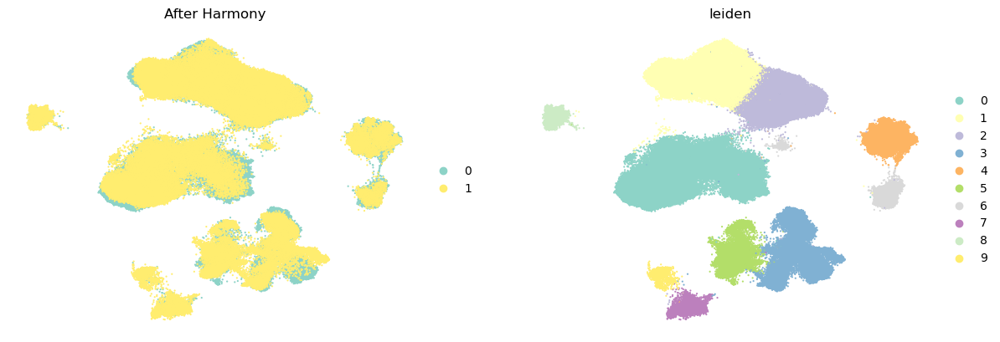

In [35]:
# Plot UMAP before Harmony, colored by batch and cluster
sc.pl.umap(adata, color=["batch", "leiden"], title="After Harmony", size=10, frameon=False,  show=False, palette='Set3')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("INT_after_harmony.png", dpi=300)
plt.show() 

In [34]:
adata.write("Harmony_INT.h5ad")

In [54]:
adata=sc.read('Harmony_INT.h5ad')

In [55]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')


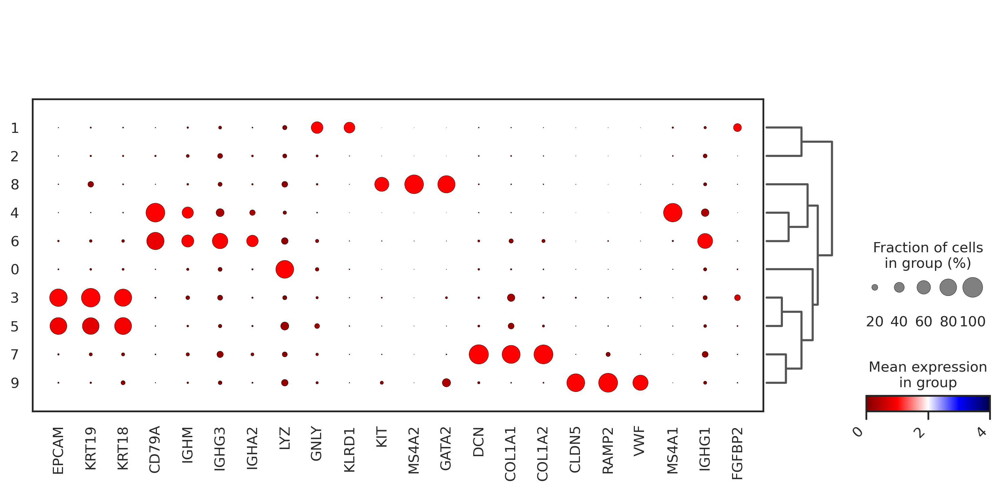

In [56]:
marker_genes = [
    'EPCAM', 'KRT19', 'CDH1', 'KRT18', 'CD3D', 'CD3E', 'CD3G', 'TRAC', 
    'CD79A', 'IGHM', 'IGHG3', 'IGHA2', 'CD68', 'MARCO', 'FCGR3A', 'LYZ', 
    'NCAM1', 'NKG7', 'GNLY', 'KLRD1', 'KIT', 'MS4A2', 'GATA2', 'DCN', 
    'COL1A1', 'COL1A2', 'THY1', 'PECAM1', 'CLDN5', 'FLT1', 'RAMP2', 
    'OLIG1', 'OLIG2', 'MOG', 'CLDN11','VWF', 'MS4A1', 'IGHG1', 'CSF3R',
    'FGFBP2','LILRA4','MKI67','PTPRC'
]
marker= [gene for gene in marker_genes if gene in adata.var_names]
sns.set_theme(style='white', font_scale=1) 
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sc.tl.dendrogram(adata,groupby='leiden')
sc.pl.dotplot(adata,  marker, groupby='leiden', dendrogram=True,  log=False, swap_axes=False,  vmax=4,  ax=ax, 
    cmap="seismic_r",   standard_scale="var",  show=False)
 
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=12) 
plt.tight_layout()
plt.savefig("dot_cell_type.png", dpi=300)
plt.show()

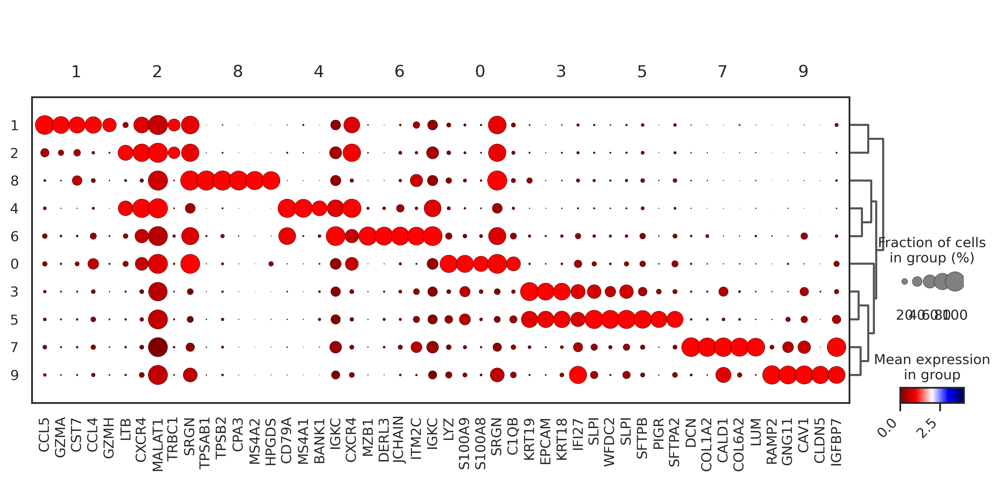

In [57]:
sns.set_theme(style='white', font_scale=1) 
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sc.tl.dendrogram(adata,groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata,  groupby='leiden', n_genes=5, dendrogram=True,  log=False, swap_axes=False,  vmax=4,  ax=ax, 
    cmap="seismic_r",   standard_scale="var",  show=False)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=12) 
plt.tight_layout()
plt.savefig("dotplot_cell_type2.png", dpi=300)
plt.show()

In [58]:
ranked_genes = adata.uns['rank_genes_groups']
top_genes = {}
for cluster in ranked_genes['names'].dtype.names:  
    top_genes[cluster] = ranked_genes['names'][cluster][:5]  
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {', '.join(genes)}")


Cluster 0: LYZ, S100A9, S100A8, SRGN, C1QB
Cluster 1: CCL5, GZMA, CST7, CCL4, GZMH
Cluster 2: LTB, CXCR4, MALAT1, TRBC1, SRGN
Cluster 3: KRT19, EPCAM, KRT18, IFI27, SLPI
Cluster 4: CD79A, MS4A1, BANK1, IGKC, CXCR4
Cluster 5: WFDC2, SLPI, SFTPB, PIGR, SFTPA2
Cluster 6: MZB1, DERL3, JCHAIN, ITM2C, IGKC
Cluster 7: DCN, COL1A2, CALD1, COL6A2, LUM
Cluster 8: TPSAB1, TPSB2, CPA3, MS4A2, HPGDS
Cluster 9: RAMP2, GNG11, CAV1, CLDN5, IGFBP7


In [59]:
cluster_to_cell = {
    0: "Myeloid Cells",
    1: "T cells",
    2: "T cells",
    3: "Epithelial",
    4: "B cells ",
    5: "Epithelial",
    6: "B Cells",
    7: "Fibroblasts",
    8: "Mast cells",
    9: "Endothelial cells"
}

adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['cell'] = adata.obs['leiden'].map(cluster_to_cell)
adata.obs[['leiden', 'cell']].head()

,leiden,cell
BD_immune01_612637-0,3,Epithelial
BD_immune01_698718-0,3,Epithelial
BD_immune01_509246-0,3,Epithelial
BD_immune01_101435-0,3,Epithelial
BD_immune01_400370-0,1,T cells


In [60]:
adata.write("cell_INT.h5ad")

In [7]:
adata=sc.read("cell_INT.h5ad")

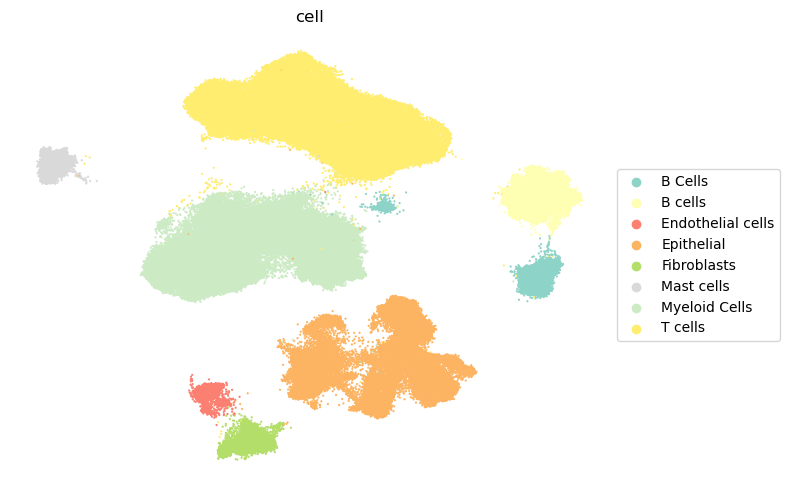

In [8]:
fig, ax = plt.subplots(figsize=(8, 5))  # Set figure size
sc.pl.umap(adata, color="cell", size=10, frameon=False, ax=ax, show=False, palette='Set3')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("cell_INT.png", dpi=300)
plt.show()

In [9]:
adata = adata[adata.obs['cell'] == 'Epithelial'].copy()

In [10]:
adata.obs["cell"].unique

<bound method Series.unique of BD_immune01_612637-0           Epithelial
BD_immune01_698718-0           Epithelial
BD_immune01_509246-0           Epithelial
BD_immune01_101435-0           Epithelial
BD_immune01_216465-0           Epithelial
                                  ...    
TTTGTCATCCTTGCCA_LUNG_N31-1    Epithelial
TTTGTCATCGCCAGCA_LUNG_N30-1    Epithelial
TTTGTCATCTGGGCCA_EBUS_06-1     Epithelial
TTTGTCATCTTGCCGT_LUNG_T30-1    Epithelial
TTTGTCATCTTTAGGG_LUNG_T31-1    Epithelial
Name: cell, Length: 29144, dtype: category
Categories (1, object): ['Epithelial']>

In [11]:
sc.pp.highly_variable_genes(adata, n_top_genes=1000, flavor='seurat')
sc.pp.pca(adata, n_comps=20)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10)
sc.tl.umap(adata)

In [12]:
sc.tl.leiden(adata, resolution=0.2)
num_clusters = len(adata.obs['leiden'].unique())
print(f"Number of Leiden clusters: {num_clusters}")

Number of Leiden clusters: 10


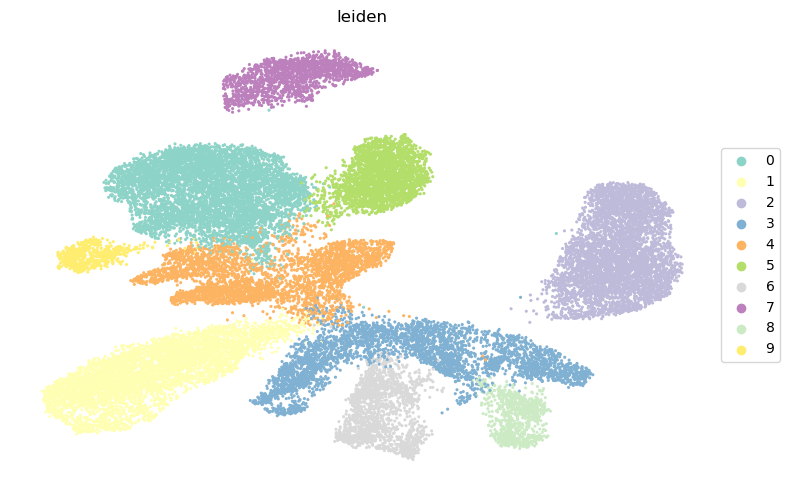

In [13]:
fig, ax = plt.subplots(figsize=(8, 5))  # Set figure size
sc.pl.umap(adata, color="leiden", size=20, frameon=False, ax=ax, show=False, palette='Set3')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("cell_epi_INT.png", dpi=300)
plt.show()

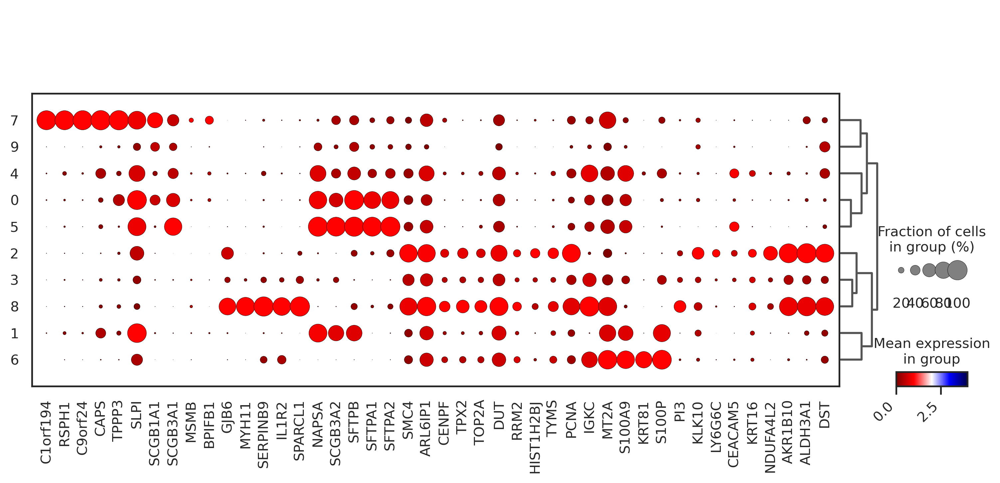

In [15]:
marker_epi= ["C1orf194", "RSPH1", "C9orf24", "CAPS", "TPPP3", "SLPI","SCGB1A1",
"SCGB3A1", "MSMB", "BPIFB1", "GJB6", "MYH11", "AL365357.1", "SERPINB9", "IL1R2",
"SPARCL1", "NAPSA", "SCGB3A2", "SFTPB", "SFTPA1","SFTPA2", "SMC4", "ARL6IP1",
"CENPF","TPX2", "TOP2A", "DUT","RRM2","HIST1H2BJ","TYMS", "PCNA","IGKC","MT2A",
"S100A9","KRT81","S100P","PI3","KLK10","LY6G6C","CEACAM5","KRT16","NDUFA4L2","AKR1B10","NMRAL2P","ALDH3A1", "DST"]


marker= [gene for gene in marker_epi if gene in adata.var_names]
sns.set_theme(style='white', font_scale=1) 
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sc.tl.dendrogram(adata,groupby='leiden')
sc.pl.dotplot(adata,  marker, groupby='leiden', dendrogram=True,  log=False, swap_axes=False,  vmax=4,  ax=ax, 
    cmap="seismic_r",   standard_scale="var",  show=False)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=12) 
plt.tight_layout()
plt.savefig("dotplot_suptype_INT.png", dpi=300)
plt.show()

In [16]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='wilcoxon')


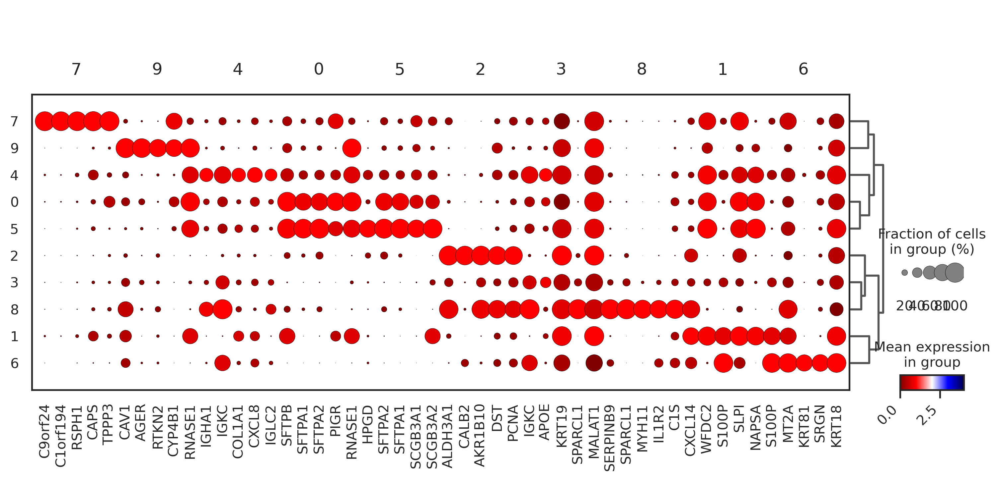

In [17]:
sns.set_theme(style='white', font_scale=1) 
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
sc.tl.dendrogram(adata,groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata,  groupby='leiden', n_genes=5, dendrogram=True,  log=False, swap_axes=False,  vmax=4,  ax=ax, 
    cmap="seismic_r",   standard_scale="var",  show=False)

plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=12) 
plt.tight_layout()
plt.savefig("dotplot_suptype2_INT.png", dpi=300)
plt.show()

In [18]:
ranked_genes = adata.uns['rank_genes_groups']
top_genes = {}
for cluster in ranked_genes['names'].dtype.names:  
    top_genes[cluster] = ranked_genes['names'][cluster][:5]  
for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {', '.join(genes)}")


Cluster 0: SFTPB, SFTPA1, SFTPA2, PIGR, RNASE1
Cluster 1: CXCL14, WFDC2, S100P, SLPI, NAPSA
Cluster 2: ALDH3A1, CALB2, AKR1B10, DST, PCNA
Cluster 3: IGKC, APOE, KRT19, SPARCL1, MALAT1
Cluster 4: IGHA1, IGKC, COL1A1, CXCL8, IGLC2
Cluster 5: HPGD, SFTPA2, SFTPA1, SCGB3A1, SCGB3A2
Cluster 6: S100P, MT2A, KRT81, SRGN, KRT18
Cluster 7: C9orf24, C1orf194, RSPH1, CAPS, TPPP3
Cluster 8: SERPINB9, SPARCL1, MYH11, IL1R2, C1S
Cluster 9: CAV1, AGER, RTKN2, CYP4B1, RNASE1


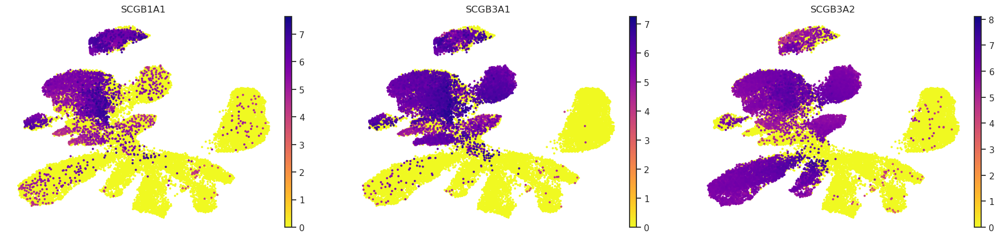

In [19]:
sc.pl.umap(adata, color=["SCGB1A1",'SCGB3A1', 'SCGB3A2' ], size=30, frameon=False, show=False, cmap="plasma_r")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

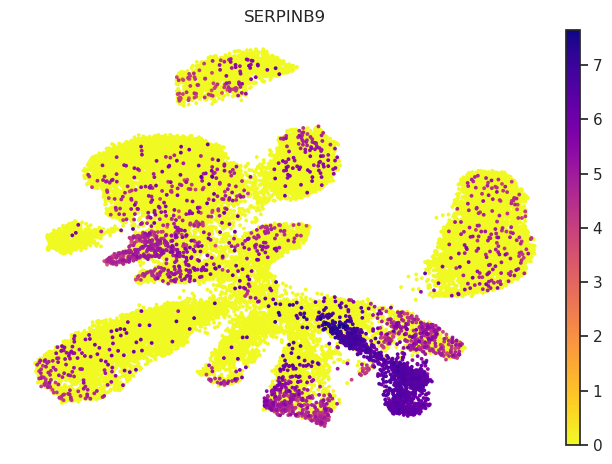

In [20]:
sc.pl.umap(adata, color=["SERPINB9"], size=30, frameon=False, show=False, cmap="plasma_r")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()

In [21]:
cluster_to_epithelial = {
    0: "Club",  
    1: "Club",
    2: "Basal",
    3: "Hillock",  
    4: "Club",
    5: "Club",
    6: "Hillock",
    7: "Ciliated",
    8: "Hillock",
    9: "Club", 
}

adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['epithelial'] = adata.obs['leiden'].map(cluster_to_epithelial)
adata.obs[['leiden', 'epithelial']].head()

,leiden,epithelial
BD_immune01_612637-0,3,Hillock
BD_immune01_698718-0,3,Hillock
BD_immune01_509246-0,3,Hillock
BD_immune01_101435-0,3,Hillock
BD_immune01_216465-0,3,Hillock


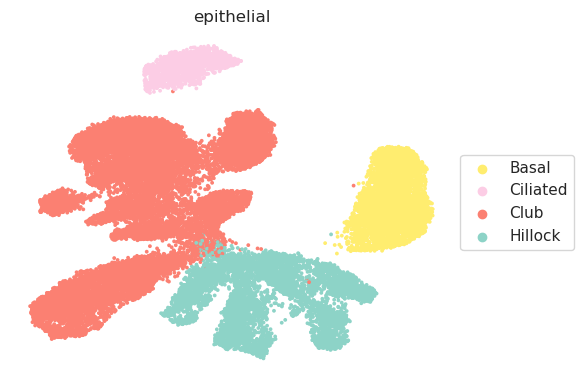

In [29]:
fig, ax = plt.subplots(figsize=(6, 4))  
sc.pl.umap(adata, color=["epithelial"], size=30, frameon=False,ax=ax, show=False , palette='Set3_r')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("epithelial_INT.png", dpi=300)
plt.show()

In [30]:
adata.write("epithelial_INT.h5ad")

In [52]:
adata=sc.read("epithelial_INT.h5ad")

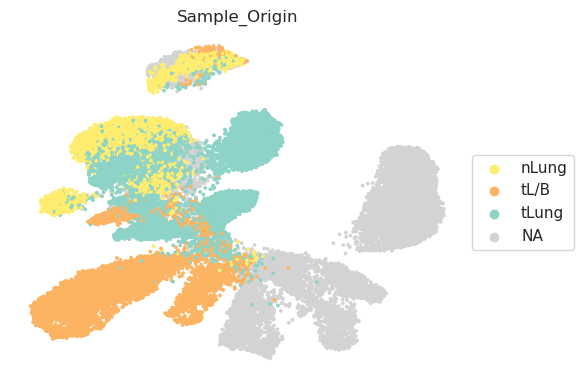

In [53]:
fig, ax = plt.subplots(figsize=(6, 4))  
sc.pl.umap(adata, color=["Sample_Origin"], size=30, frameon=False,ax=ax, show=False , palette='Set3_r')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("Sample_INT.png", dpi=300)
plt.show()

In [32]:
file_path = 'gene_signatures.xlsx'

gene_set_df = pd.read_excel(file_path)
print(gene_set_df.head())

missing_genes = {}
for module in gene_set_df.columns:
    missing_genes[module] = [gene for gene in gene_set_df[module] if gene not in adata.var_names]

# Step 2: Display missing genes for each module
for module, genes in missing_genes.items():
    if genes:
        print(f"Missing genes in module {module}: {genes}")

# Step 3: Filter the gene lists to include only genes available in `adata.var_names`
for module in gene_set_df.columns:
    valid_genes = [gene for gene in gene_set_df[module] if gene in adata.var_names]
    
    if valid_genes:
        print(f"Scoring genes for module {module}...")
        sc.tl.score_genes(adata, gene_list=valid_genes, score_name=f"score_{module}", random_state=123456)
    else:
        print(f"No valid genes for module {module} available in the data.")

# Step 4: Verify the scores were added
print(adata.obs.columns)

  Club Henry et al. 2018 Hillock Henry et al. 2018 scNMF Club  \
0                SCGB3A1                     KRT13       SLPI   
1                   LCN2                     S100P      WFDC2   
2                   PIGR                  APOBEC3A     CRABP2   
3                   PSCA                     GDF15       ASS1   
4                  OLFM4                      CSTB     S100A6   

  scNMF senescent epithelium scNMF interferon signaling epithelium  \
0                       SLPI                               HLA-DRA   
1                      WFDC2                                  CD74   
2                     CRABP2                              HLA-DRB1   
3                       ASS1                              HLA-DPA1   
4                     S100A6                              HLA-DQB1   

  PMN-MDSC activity MDSC Hirz 2023 MDSC Calcinotto 2018  \
0             RPL21          CEBPB                 IL4R   
1              XAF1           IL10             TNFRSF17   
2          

In [33]:
modules = [
    'score_Club Henry et al. 2018',
    'score_Hillock Henry et al. 2018',
    'score_scNMF Club',
    'score_scNMF senescent epithelium',
    'score_scNMF interferon signaling epithelium',
    'score_PMN-MDSC activity',
    'score_MDSC Hirz 2023',
    'score_MDSC Calcinotto 2018',
    'score_BPECT Luminal Identity',
    'score_BPECT Basal Identity',
    'score_BPECT Club Identity',
    'score_BPECT Hillock Identity',
    'score_BPECT Neuroendocrine Identity',
    'score_Tang et al. CRPC-AR',
    'score_Tang et al. CRPC-WNT',
    'score_Tang et al. CRPC-NE',
    'score_Tang et al. CRPC-SCL',
    'score_scNMF senescent epithelium',
    'score_Kiviaho et al. scNMF Club interferon',
    'score_Kiviaho et al. scNMF Club'
]

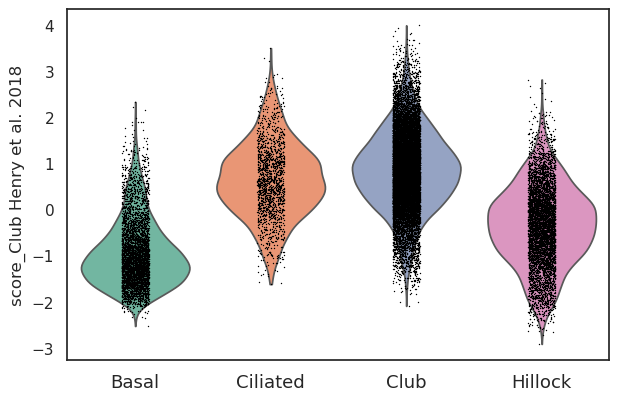

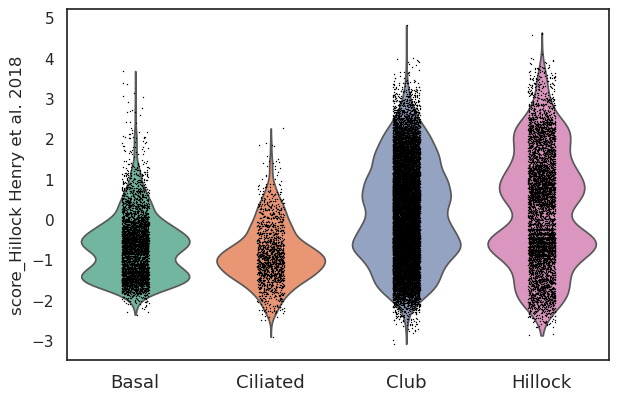

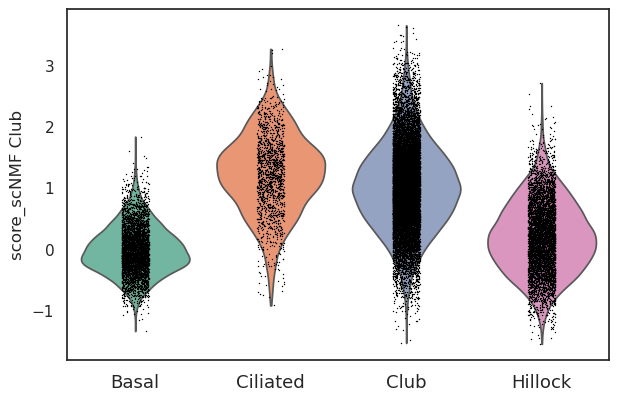

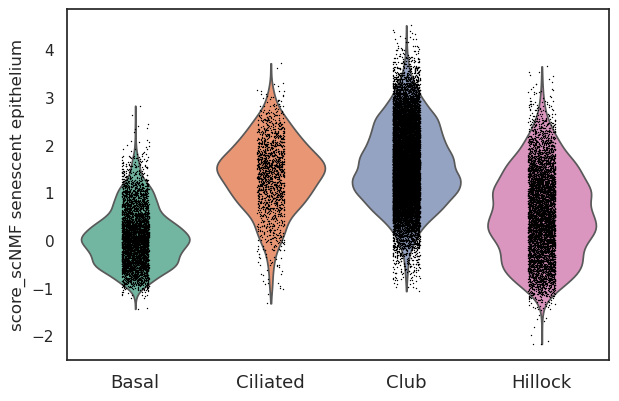

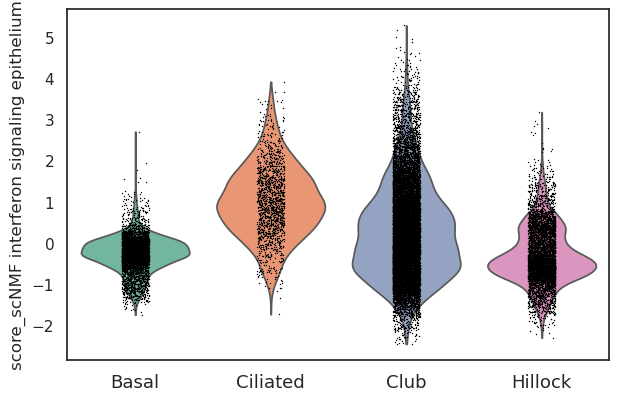

...

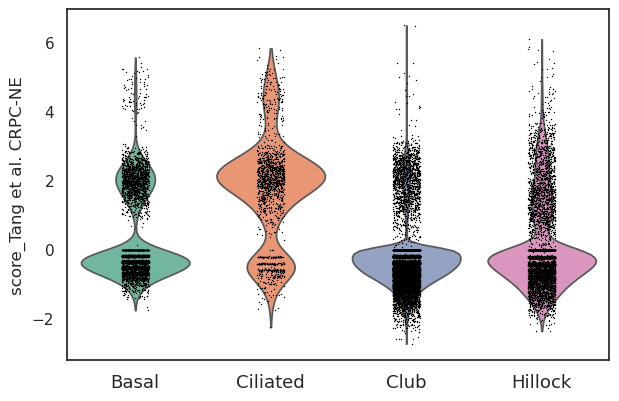

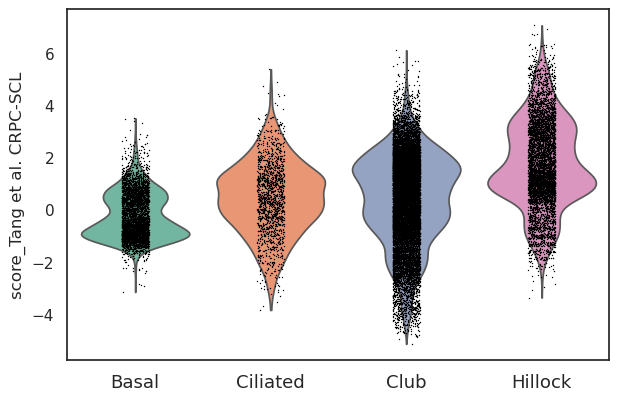

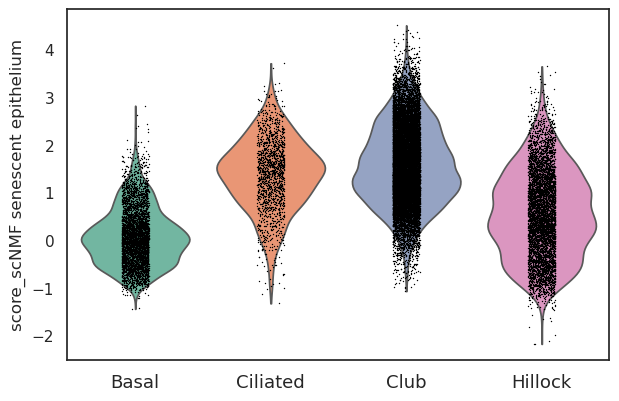

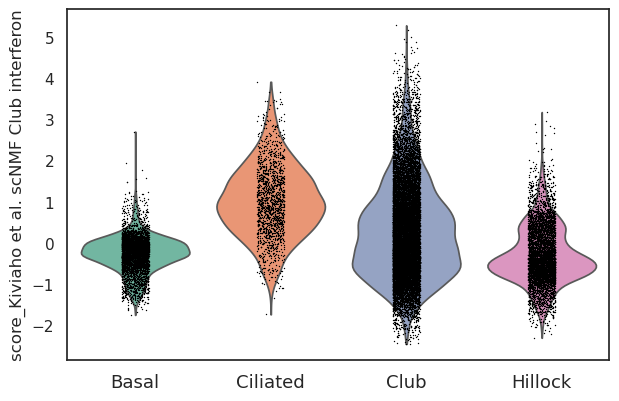

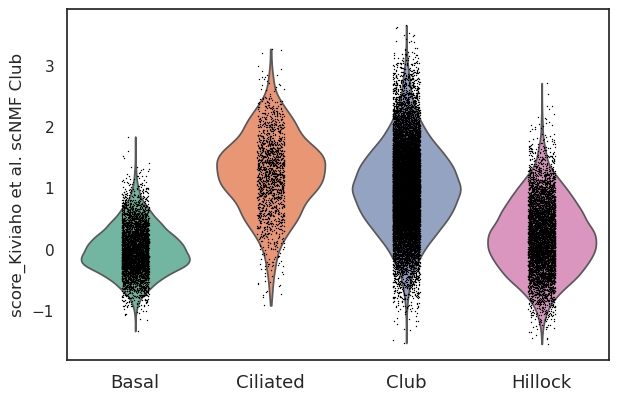

In [38]:
for name in modules:
    sc.pl.violin(adata, keys=name, groupby='epithelial', show=False, palette= 'Set2',rotation=0)
    plt.ylabel(name, fontsize=12 )
    plt.xticks(fontsize=13)
    plt.tight_layout()
    plt.savefig(f"INT_epi_{name.replace(' ', '_')}.png", dpi=300)
    plt.show()


In [54]:
adata.obs['Sample_Origin'] = adata.obs['Sample_Origin'].cat.add_categories('Post_Treatment')

# Now assign 'Post_Treatment' to the rows where 'Sample_Origin' is NaN
adata.obs.loc[adata.obs['Sample_Origin'].isna(), 'Sample_Origin'] = 'Post_Treatment'
print(adata.obs['Sample_Origin'].unique())


['Post_Treatment', 'tLung', 'nLung', 'tL/B']
Categories (4, object): ['nLung', 'tL/B', 'tLung', 'Post_Treatment']


In [55]:
adata.obs['Sample_Origin'] = pd.Categorical(
    adata.obs['Sample_Origin'], 
    categories=['nLung', 'tLung', 'tL/B', 'Post_Treatment'], 
    
)
print(adata.obs['Sample_Origin'].unique()) 

['Post_Treatment', 'tLung', 'nLung', 'tL/B']
Categories (4, object): ['nLung', 'tLung', 'tL/B', 'Post_Treatment']


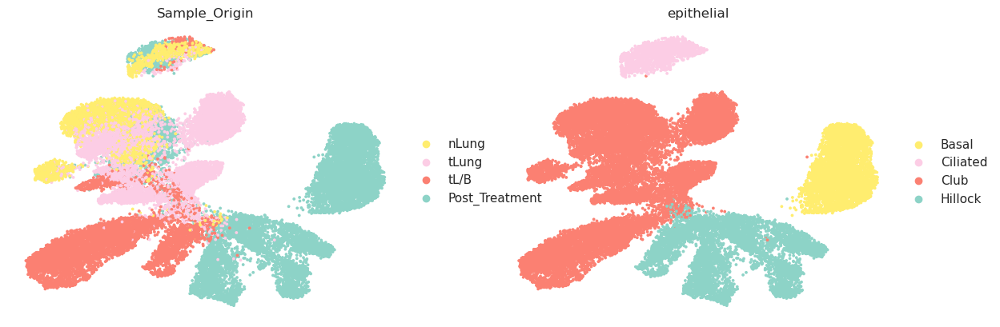

In [61]:
sc.pl.umap(adata, color=["Sample_Origin","epithelial"], size=30, frameon=False, show=False , palette='Set3_r')
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.savefig("sample_epi_INT.png", dpi=300)
plt.show()

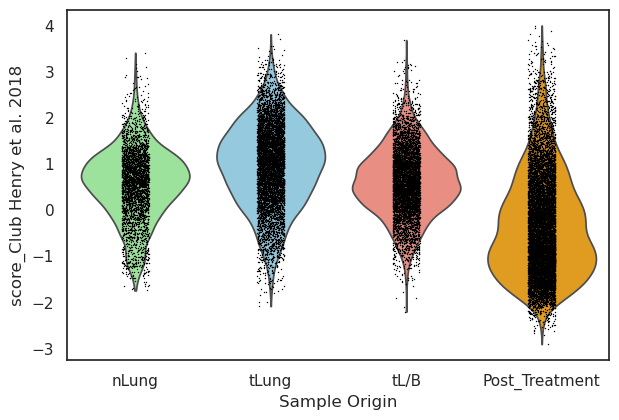

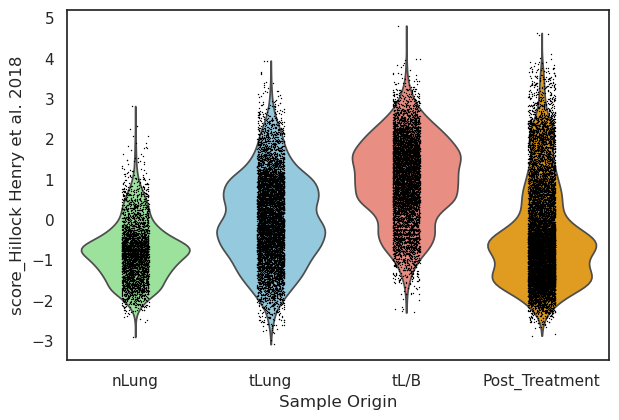

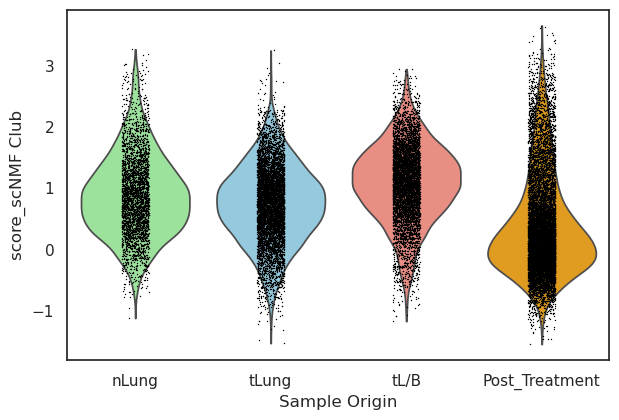

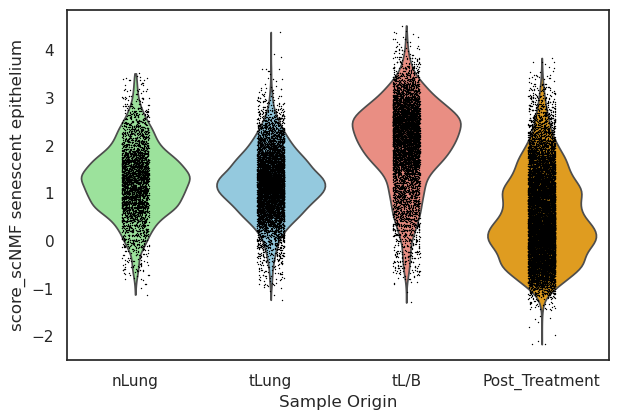

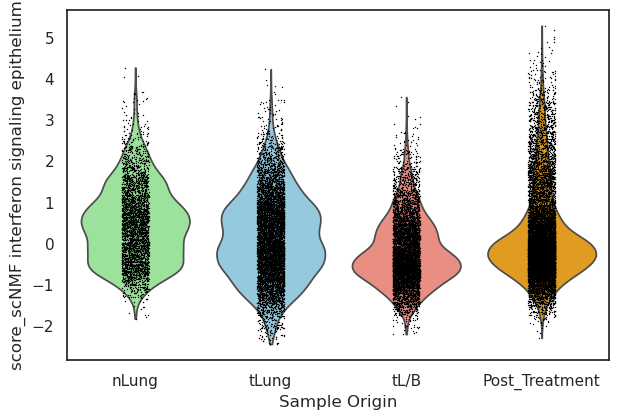

...

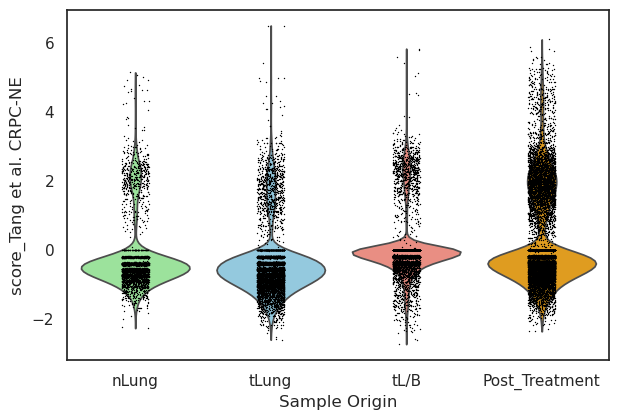

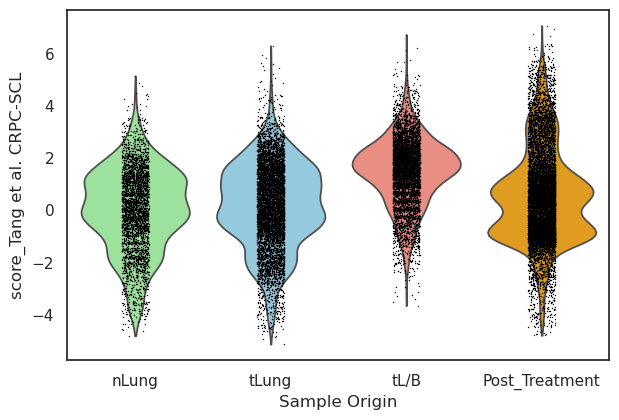

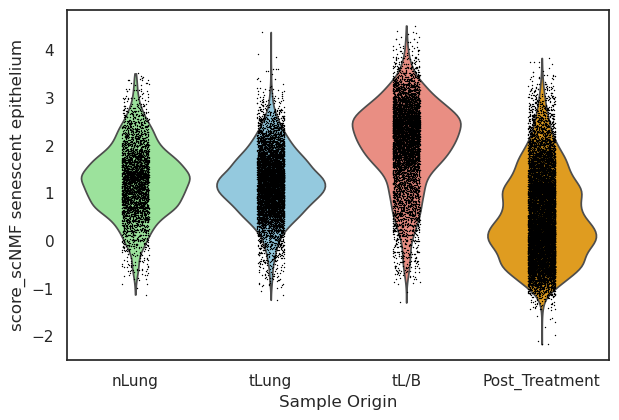

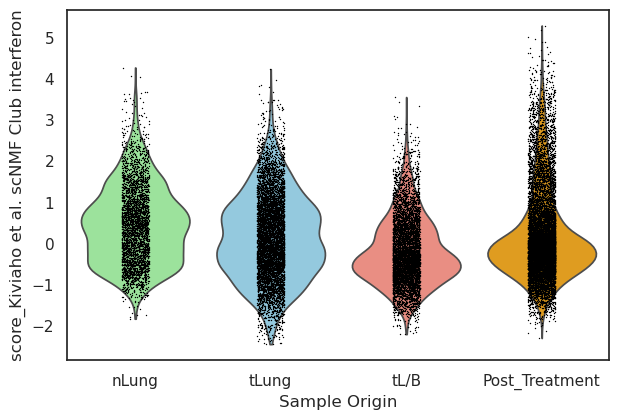

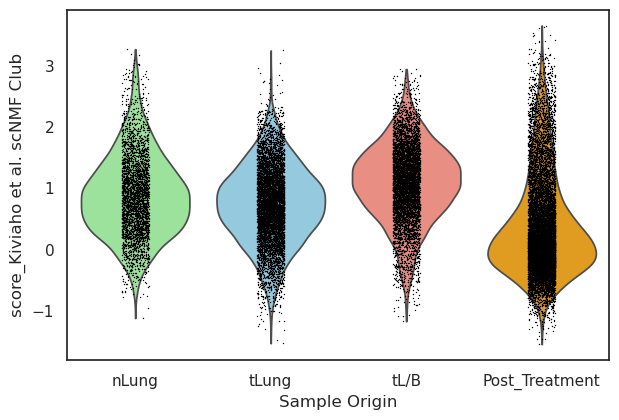

In [41]:

adata.obs['Sample_Origin'] = adata.obs['Sample_Origin'].astype('category')
for name in modules:
    sc.pl.violin(adata, keys=name,groupby='Sample_Origin', palette={'tLung': 'skyblue', 'nLung': 'lightgreen', 'tL/B': 'salmon','Post_Treatment': 'orange'}, 
                show=False)
    plt.ylabel(name, fontsize=12)
    plt.tight_layout()
    plt.savefig(f"INT2_{name.replace(' ', '_')}.png", dpi=300)
    plt.show()


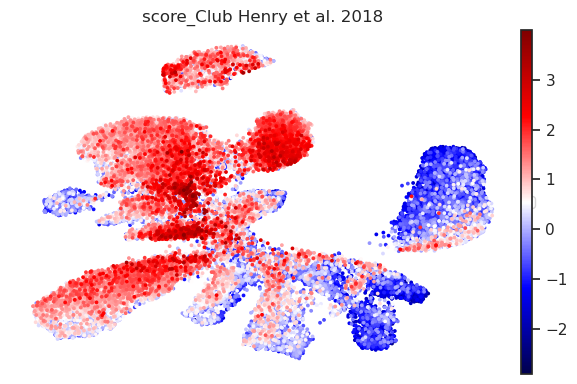

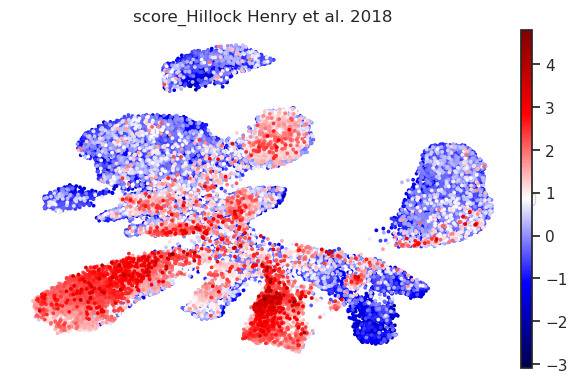

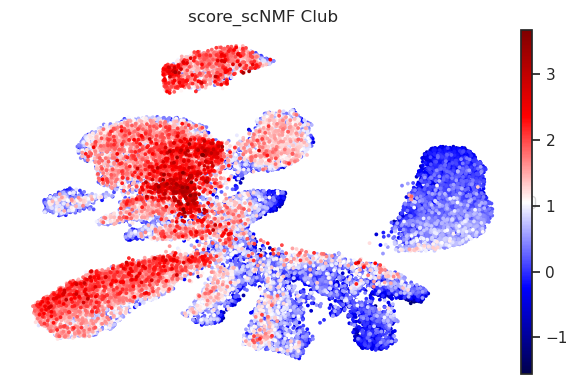

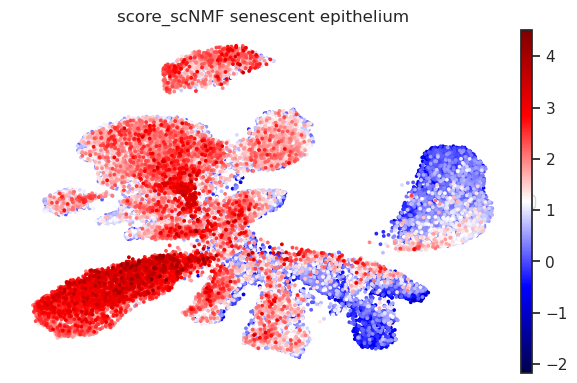

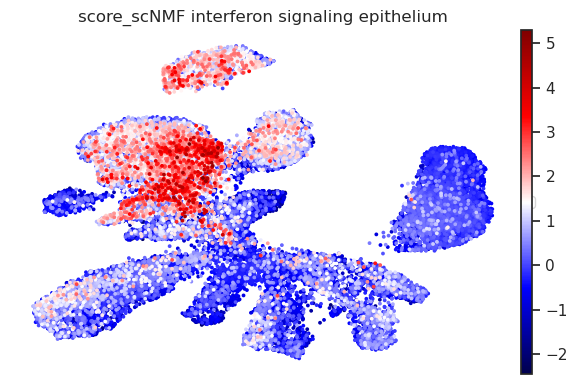

...

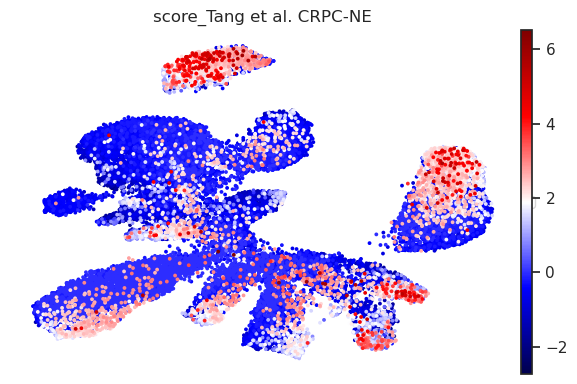

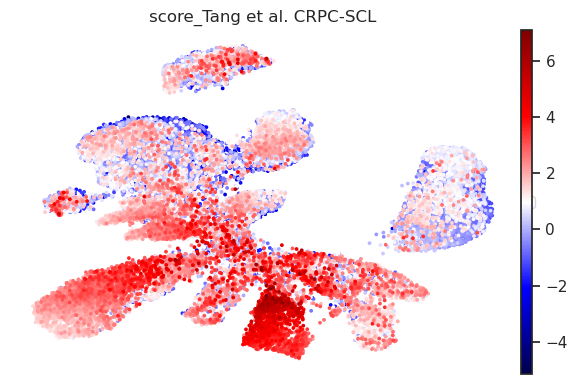

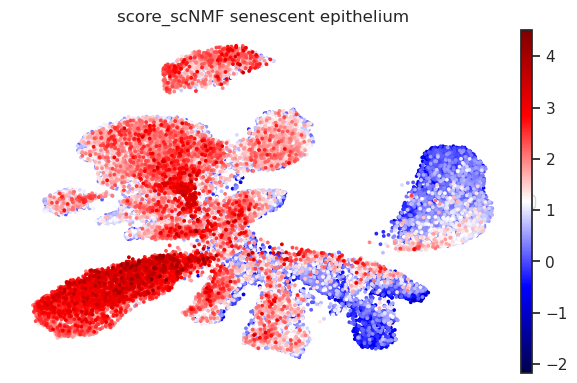

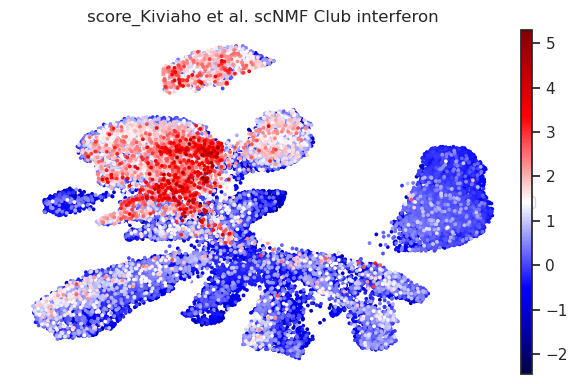

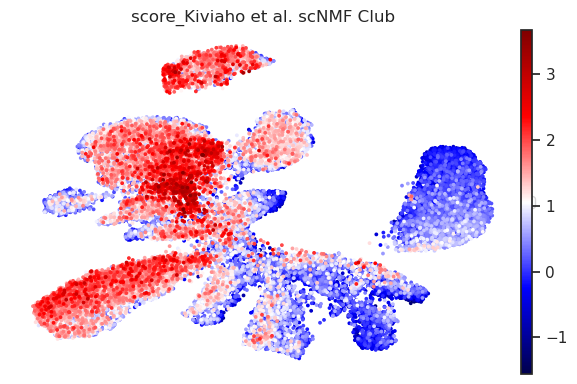

In [42]:
for name in modules:
    fig, ax = plt.subplots(figsize=(6, 4))  
    sc.pl.umap(adata, cmap= 'seismic', color=name, size=30, frameon=False, ax=ax, show=False)
    plt.ylabel(name, fontsize=12)
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.savefig(f"UMAP_INT2_{name.replace(' ', '_')}.png", dpi=300)
    plt.show()

In [43]:
from scipy import stats
from statsmodels.stats.multitest import multipletests
# Define the pairs to compare
pairs = [("nLung", "tLung"), ("nLung", "tL/B"), ("tLung", "tL/B"), ("nLung", 'Post_Treatment'), ("tLung", 'Post_Treatment'), ("tL/B", 'Post_Treatment')]

# Extract relevant data
adata_df = adata.obs[['epithelial', 'Sample', 'Sample_Origin']].copy()

# Filter for Secretory (Club) and Secretory (Club) + Goblet cells
club_cells_data = adata_df[adata_df['epithelial'] == 'Club']

# Count club cells per sample
club_cells_counts = club_cells_data.groupby(['Sample']).size()
total_counts = adata_df.groupby(['Sample']).size()

# Calculate the percentage of Hillock cells for each sample
club_cells_pct = (club_cells_counts / total_counts) * 100

# Convert to DataFrame for easy manipulation
plot_data = club_cells_pct.reset_index()
plot_data.columns = ['Sample', 'Percentage']

# Merge with the Sample_Origin data
plot_data = plot_data.merge(adata.obs[['Sample', 'Sample_Origin']].drop_duplicates(), on='Sample')

# Store results for the p-values
p_values = []

# Perform pairwise Wilcoxon rank-sum tests (Mann-Whitney U test)
for g1, g2 in pairs:
    group1 = plot_data[plot_data['Sample_Origin'] == g1]['Percentage']
    group2 = plot_data[plot_data['Sample_Origin'] == g2]['Percentage']
    
    if len(group1) > 0 and len(group2) > 0:
        stat, p = stats.mannwhitneyu(group1, group2, alternative='two-sided')
        p_values.append((g1, g2, p))

# Convert p-values to DataFrame
p_values_df = pd.DataFrame(p_values, columns=["Group1", "Group2", "P-value"])

# Apply multiple testing correction (Bonferroni)
p_values_df["Adjusted P-value"] = multipletests(p_values_df["P-value"], method="bonferroni")[1]

# Print results
print(p_values_df)

  Group1          Group2   P-value  Adjusted P-value
0  nLung           tLung  0.003127          0.018765
1  nLung            tL/B  0.851282          1.000000
2  tLung            tL/B  0.342857          1.000000
3  nLung  Post_Treatment  0.029273          0.175635
4  tLung  Post_Treatment  0.000280          0.001681
5   tL/B  Post_Treatment  0.664603          1.000000


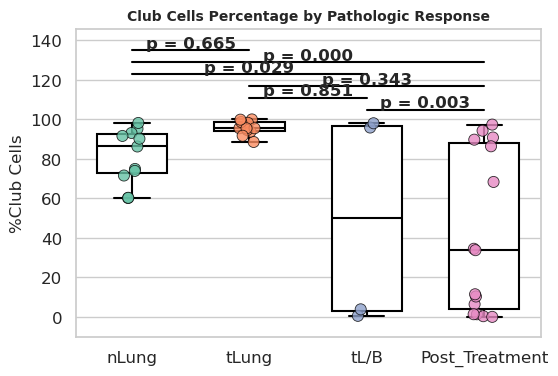

In [44]:
sns.set_style("whitegrid")
plt.figure(figsize=(6, 4))


plot_data['Sample_Origin'] = plot_data['Sample_Origin'].astype('category')
plot_data['Sample_Origin'] = plot_data['Sample_Origin'].cat.remove_unused_categories()
sample_palette = sns.color_palette("Set2", n_colors=len(plot_data['Sample_Origin'].cat.categories))


ax = sns.boxplot(data=plot_data, x='Sample_Origin', y='Percentage', 
                 width=0.6, linewidth=1.5, fliersize=0,  
                 boxprops=dict(facecolor='white', edgecolor='black'),
                 whiskerprops=dict(color="black"),
                 capprops=dict(color="black"),
                 medianprops=dict(color="black"),
                 zorder=1) 


sns.stripplot(data=plot_data, x='Sample_Origin', y='Percentage', 
              palette=sample_palette, jitter=True, size=8, alpha=0.8, edgecolor="black", linewidth=0.6, zorder=2)

# Add p-values above the boxes
y_max = plot_data["Percentage"].max() + 5  
for (g1, g2, p) in p_values:
    x1, x2 = list(plot_data["Sample_Origin"].unique()).index(g1), list(plot_data["Sample_Origin"].unique()).index(g2)
    plt.plot([x1, x2], [y_max, y_max], color="black", linewidth=1.5)
    plt.text((x1 + x2) / 2, y_max + 1, f"p = {p:.3f}", ha='center', fontsize=12, fontweight='bold')
    y_max += 6  


plt.title("Club Cells Percentage by Pathologic Response", fontsize=10, fontweight="bold")
plt.xlabel("")
plt.ylabel("%Club Cells", fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(-10, y_max + 5)  
plt.savefig("percentage_club_INT2.png", dpi=300)
plt.show()


In [45]:
adata.obs.to_csv("adata2_INT_obs.csv")

In [46]:
#First analysis 
adata=sc.read("INT_annotation_score_epi.h5ad")

In [47]:
adata.obs['Sample_Origin'] = adata.obs['Sample_Origin'].cat.add_categories('Post_Treatment')
adata.obs.loc[adata.obs['Sample_Origin'].isna(), 'Sample_Origin'] = 'Post_Treatment'
print(adata.obs['Sample_Origin'].unique())



adata.obs['Sample_Origin'] = pd.Categorical(
    adata.obs['Sample_Origin'], 
    categories=['nLung', 'tLung', 'tL/B', 'Post_Treatment'], 
    
)
print(adata.obs['Sample_Origin'].unique()) 
adata.obs['Sample_Origin'] = adata.obs['Sample_Origin'].astype('category')



['tLung', 'nLung', 'tL/B', 'Post_Treatment']
Categories (4, object): ['nLung', 'tL/B', 'tLung', 'Post_Treatment']
['tLung', 'nLung', 'tL/B', 'Post_Treatment']
Categories (4, object): ['nLung', 'tLung', 'tL/B', 'Post_Treatment']


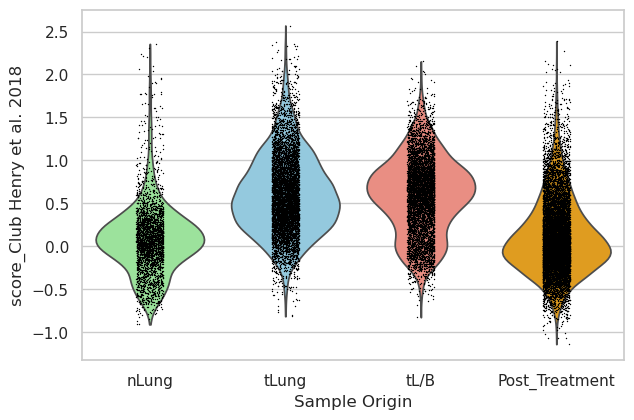

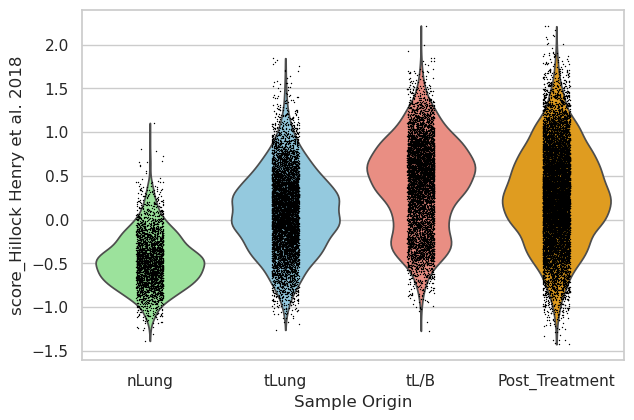

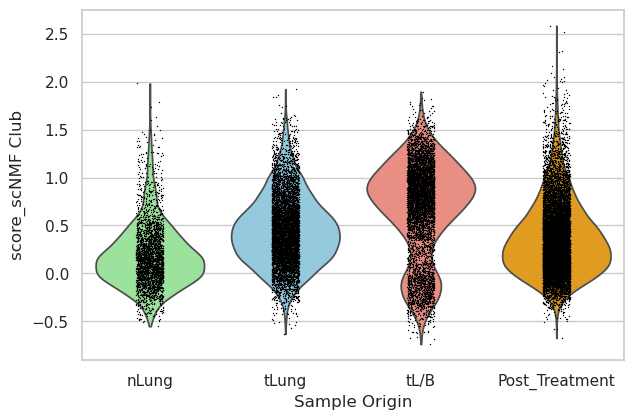

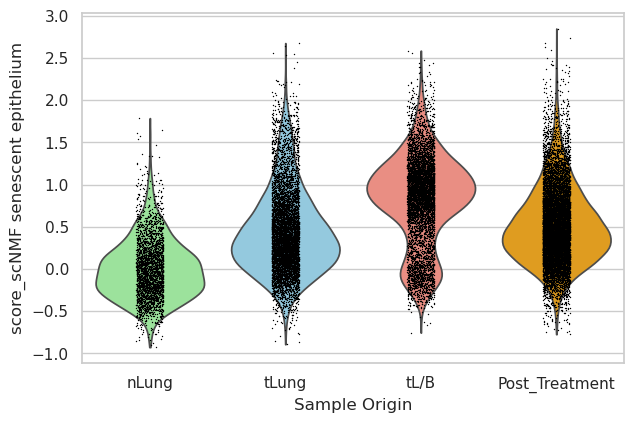

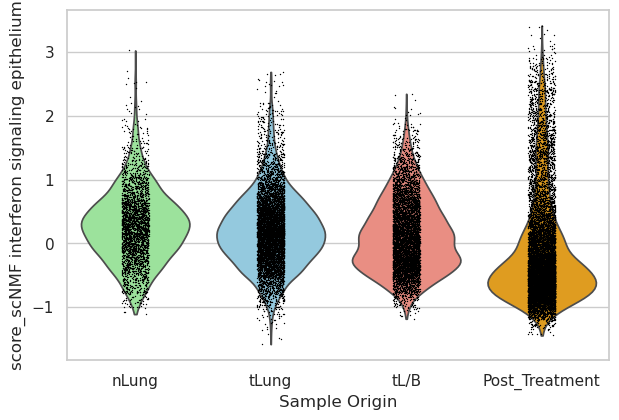

...

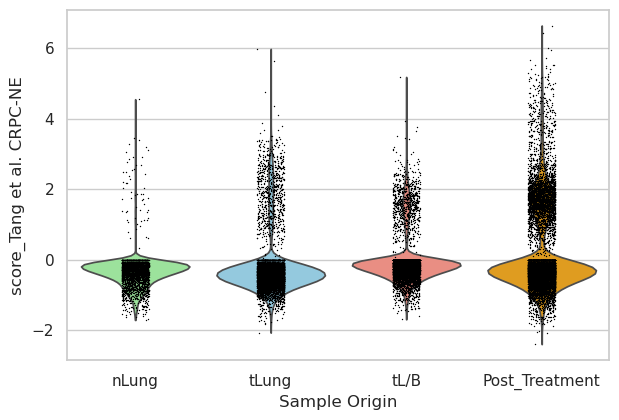

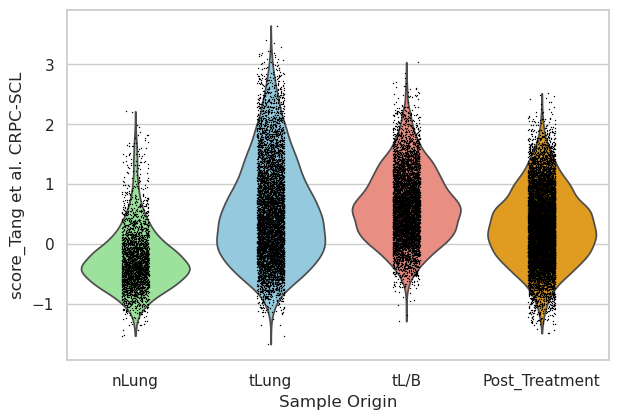

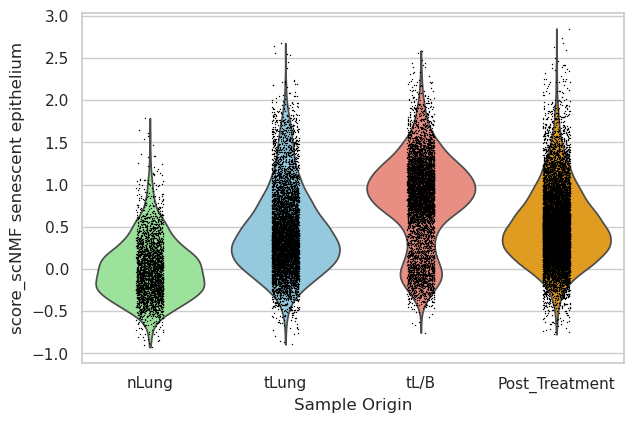

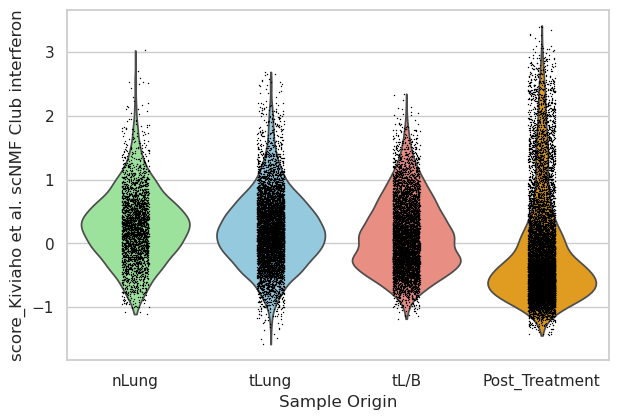

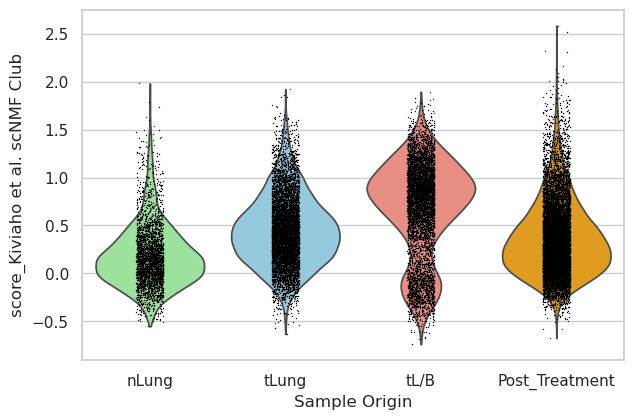

In [48]:
for name in modules:
    sc.pl.violin(adata, keys=name,groupby='Sample_Origin', palette={'tLung': 'skyblue', 'nLung': 'lightgreen', 'tL/B': 'salmon','Post_Treatment': 'orange'}, 
                show=False)
    plt.ylabel(name, fontsize=12)
    plt.tight_layout()
    plt.savefig(f"INT1_{name.replace(' ', '_')}.png", dpi=300)
    plt.show()

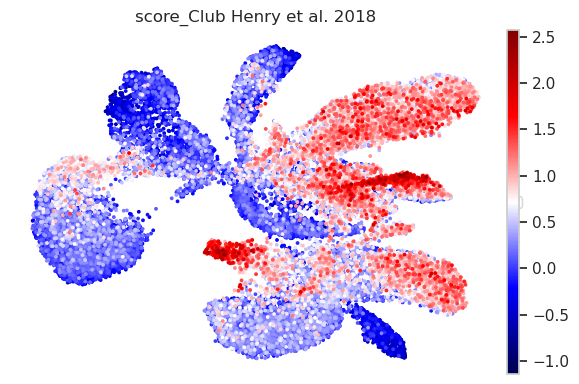

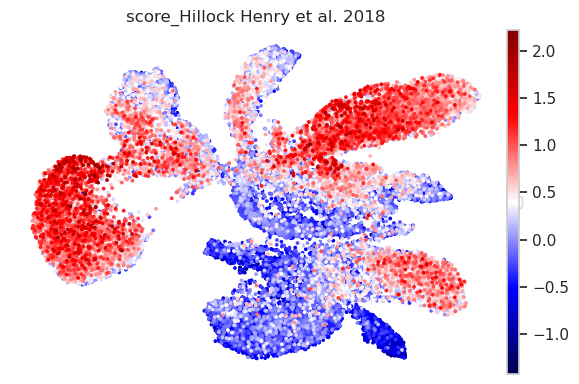

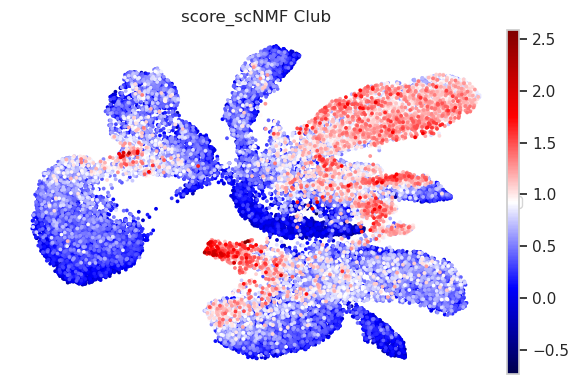

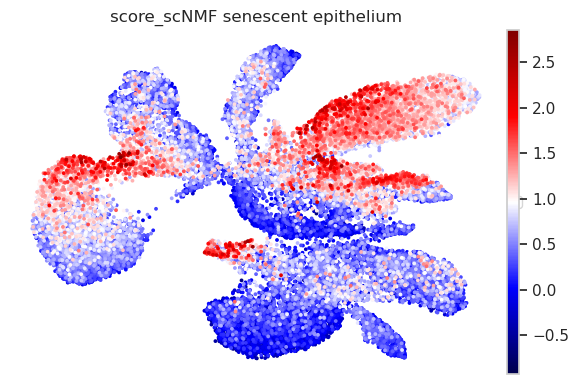

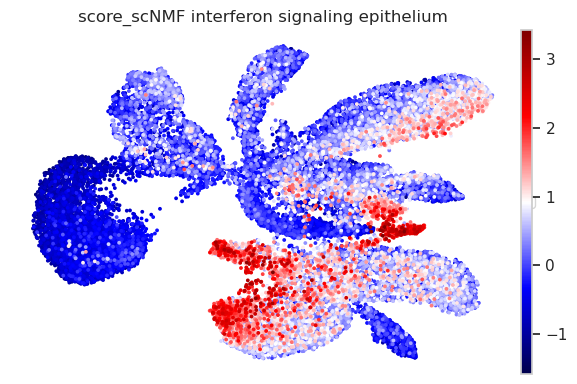

...

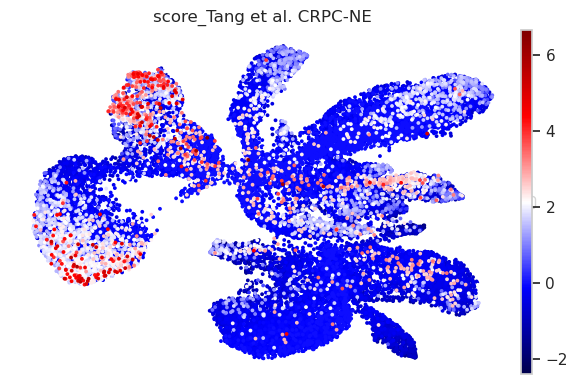

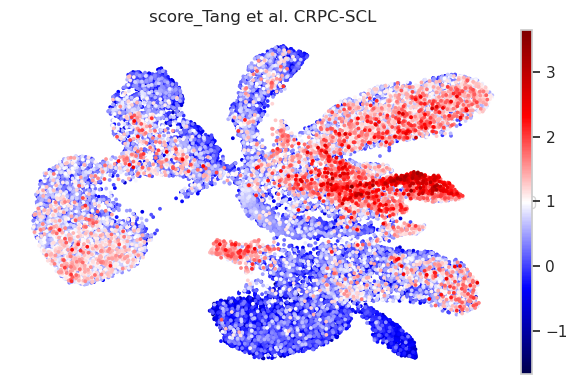

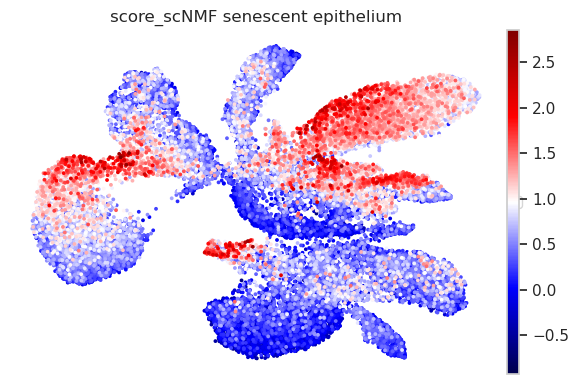

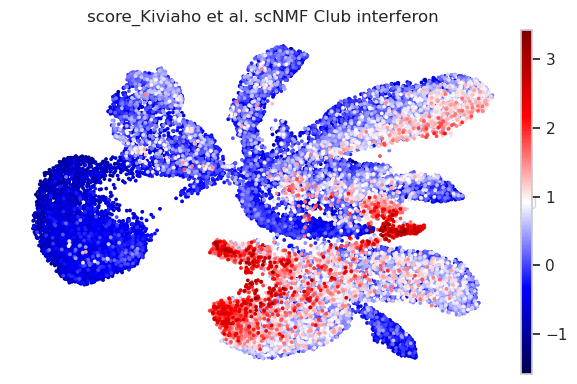

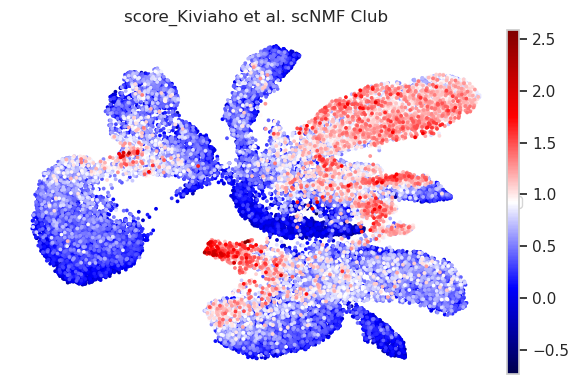

In [49]:
for name in modules:
    fig, ax = plt.subplots(figsize=(6, 4))  
    sc.pl.umap(adata, cmap= 'seismic', color=name, size=30, frameon=False, ax=ax, show=False)
    plt.ylabel(name, fontsize=12)
    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.savefig(f"UMAP_INT1_{name.replace(' ', '_')}.png", dpi=300)
    plt.show()

In [51]:
adata.obs.to_csv("adata1_INT_obs.csv")